# DATASET INFORMATION

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017

In [1]:
#Importing all the needed libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Storing the dataset into df & printing it

df=pd.read_csv('TEMPRATURE-PROJECT.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [3]:
#Printing the shape of the dataset it is showing that 7752 rows & 25 columns 

df.shape

(7752, 25)

In [4]:
#Printing the first five rows of the dataset

df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [5]:
#Printing the last five rows of the dataset

df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [6]:
#Printing a sample row from the dataset

df.sample()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
376,2.0,15-07-2013,28.1,23.3,77.179672,91.483498,27.320412,24.529431,10.674664,29.64751,...,0.0,0.052882,0.0,37.6046,127.032,44.7624,0.5141,5727.288086,28.5,24.1


In [7]:
#Printing all the datatypes of all the columns 

df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [8]:
#Printing all the column names that are present in the dataset

df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [9]:
#Printing the skewness of all the columns

df.skew()

station             0.000000
Present_Tmax       -0.262942
Present_Tmin       -0.365875
LDAPS_RHmin         0.298765
LDAPS_RHmax        -0.850870
LDAPS_Tmax_lapse   -0.226775
LDAPS_Tmin_lapse   -0.578943
LDAPS_WS            1.571581
LDAPS_LH            0.670491
LDAPS_CC1           0.457231
LDAPS_CC2           0.470060
LDAPS_CC3           0.637630
LDAPS_CC4           0.663251
LDAPS_PPT1          5.367675
LDAPS_PPT2          5.747360
LDAPS_PPT3          6.425829
LDAPS_PPT4          6.792379
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.339607
Next_Tmin          -0.403743
dtype: float64

In [10]:
#Getting the information of the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [11]:
#As we can see there are null values present in many of the columns

df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

<AxesSubplot:>

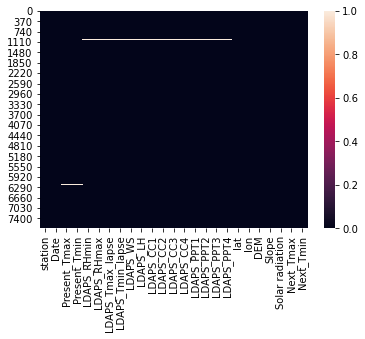

In [12]:
#The white lines that we are seeing in the heatmap are the null values present in the columns

sns.heatmap(df.isnull())

# TREATING NULL VALUES 

In [13]:
#Removing the null values

data_frame_list = [df]
for df in data_frame_list:
    df.ffill(inplace=True)
print (data_frame_list)

[      station        Date  Present_Tmax  Present_Tmin  LDAPS_RHmin  \
0         1.0  30-06-2013          28.7          21.4    58.255688   
1         2.0  30-06-2013          31.9          21.6    52.263397   
2         3.0  30-06-2013          31.6          23.3    48.690479   
3         4.0  30-06-2013          32.0          23.4    58.239788   
4         5.0  30-06-2013          31.4          21.9    56.174095   
...       ...         ...           ...           ...          ...   
7747     23.0  30-08-2017          23.3          17.1    26.741310   
7748     24.0  30-08-2017          23.3          17.7    24.040634   
7749     25.0  30-08-2017          23.2          17.4    22.933014   
7750     25.0  30-08-2017          20.0          11.3    19.794666   
7751     25.0  30-08-2017          37.6          29.9    98.524734   

      LDAPS_RHmax  LDAPS_Tmax_lapse  LDAPS_Tmin_lapse   LDAPS_WS    LDAPS_LH  \
0       91.116364         28.074101         23.006936   6.818887   69.451805  

In [14]:
#Removed all the null values

df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [15]:
#Printing the description of the each column of the dataset 

df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,13.003096,29.770653,23.229141,56.712197,88.338817,29.645517,23.543709,7.098365,62.238676,0.371083,...,0.480367,0.275978,0.266801,37.544722,126.991397,61.867972,1.257048,5341.502803,30.273491,22.932804
std,7.213213,2.969674,2.412744,14.627665,7.185832,2.952860,2.356354,2.176599,33.713771,0.262284,...,1.754885,1.156412,1.200654,0.050352,0.079435,54.279780,1.370444,429.158867,3.128761,2.488213
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.937674,84.209478,27.693091,22.114651,5.686487,37.206201,0.148321,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,54.983641,89.760822,29.745671,23.782403,6.551400,56.487289,0.320110,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.743892,25.186419,8.043589,83.904586,0.576711,...,0.017607,0.008124,0.000000,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


# DATA VISUALIZATION 

# UNIVARIET ANALYSIS

<AxesSubplot:xlabel='lat', ylabel='count'>

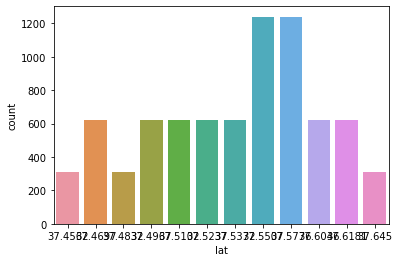

In [16]:
#Plotting the countplot of the lat column

sns.countplot(data=df,x='lat')

<AxesSubplot:xlabel='lat', ylabel='Density'>

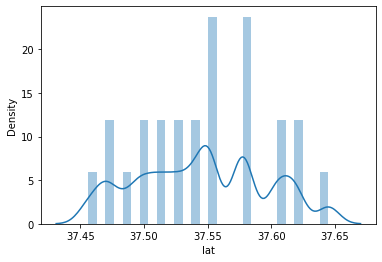

In [17]:
#Plotting distribution plot

sns.distplot(df['lat'])

<AxesSubplot:xlabel='lat'>

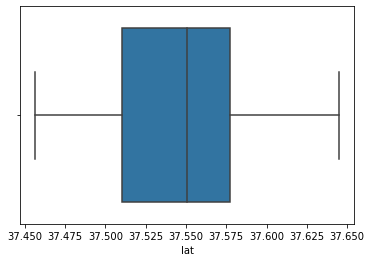

In [18]:
#Showing the boxplot of the column in lat column there are no outlier present in the column

sns.boxplot(data=df,x='lat')

<AxesSubplot:xlabel='lat'>

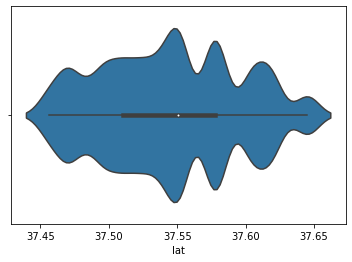

In [19]:
#Violin plot shows that it is more concentrated towards 37.45 to 37.55

sns.violinplot(df['lat'])

<AxesSubplot:xlabel='lat', ylabel='Count'>

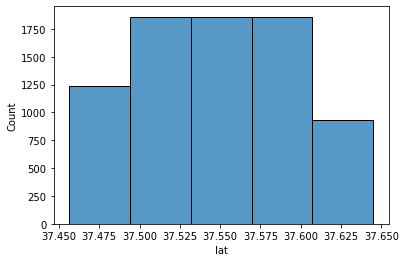

In [20]:
#Plotting histogram of the lat column

sns.histplot(df['lat'],bins=5)

# BI-VARIET ANALYSIS

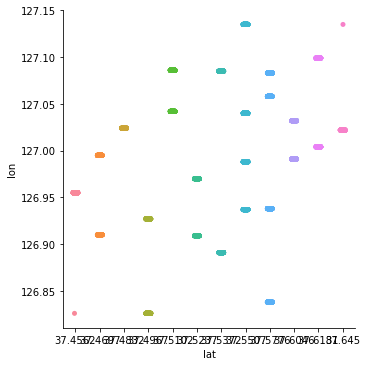

In [21]:
#Plotting the catplot of 2 columns lat & lon

sns.catplot(x='lat',y='lon',data=df)

<AxesSubplot:xlabel='lat', ylabel='lon'>

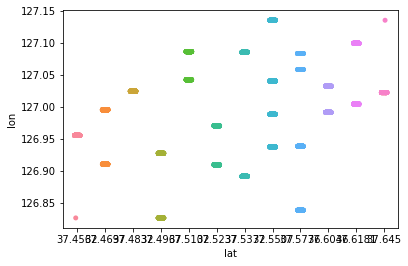

In [22]:
#Plotting stripplot of lat & lon column

sns.stripplot(x='lat',y='lon',data=df)

<AxesSubplot:xlabel='lat', ylabel='lon'>

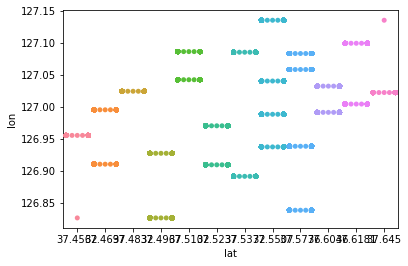

In [23]:
#Plotting swarmplot of lat & lon column

sns.swarmplot(x='lat',y='lon',data=df)

<AxesSubplot:xlabel='lat', ylabel='lon'>

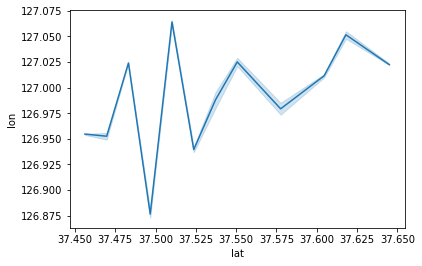

In [24]:
#Plotting the lineplot of the columns

sns.lineplot(x='lat',y='lon',data=df)

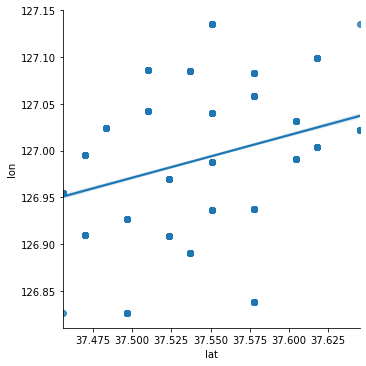

In [25]:
#Plotting lmplot of the columns

sns.lmplot('lat','lon',data=df)

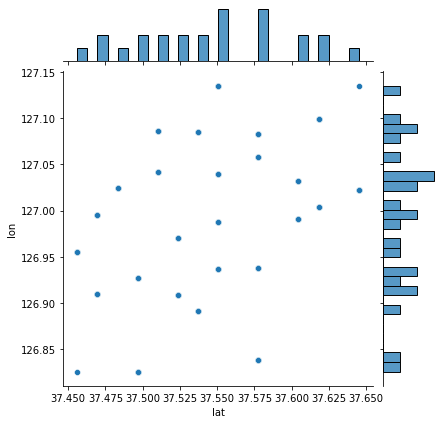

In [26]:
#Plotting lat & lon with jointplot 

sns.jointplot(x=df['lat'],y=df['lon'],data=df)

<AxesSubplot:xlabel='lat', ylabel='lon'>

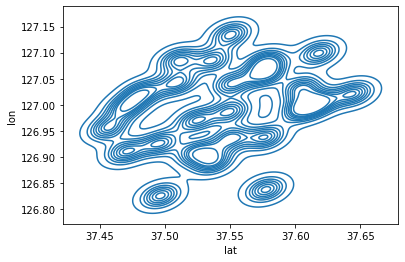

In [27]:
#Kde plot shows only the lines

sns.kdeplot(x='lat',y='lon',data=df)

# MULTIVARIET ANALYSIS

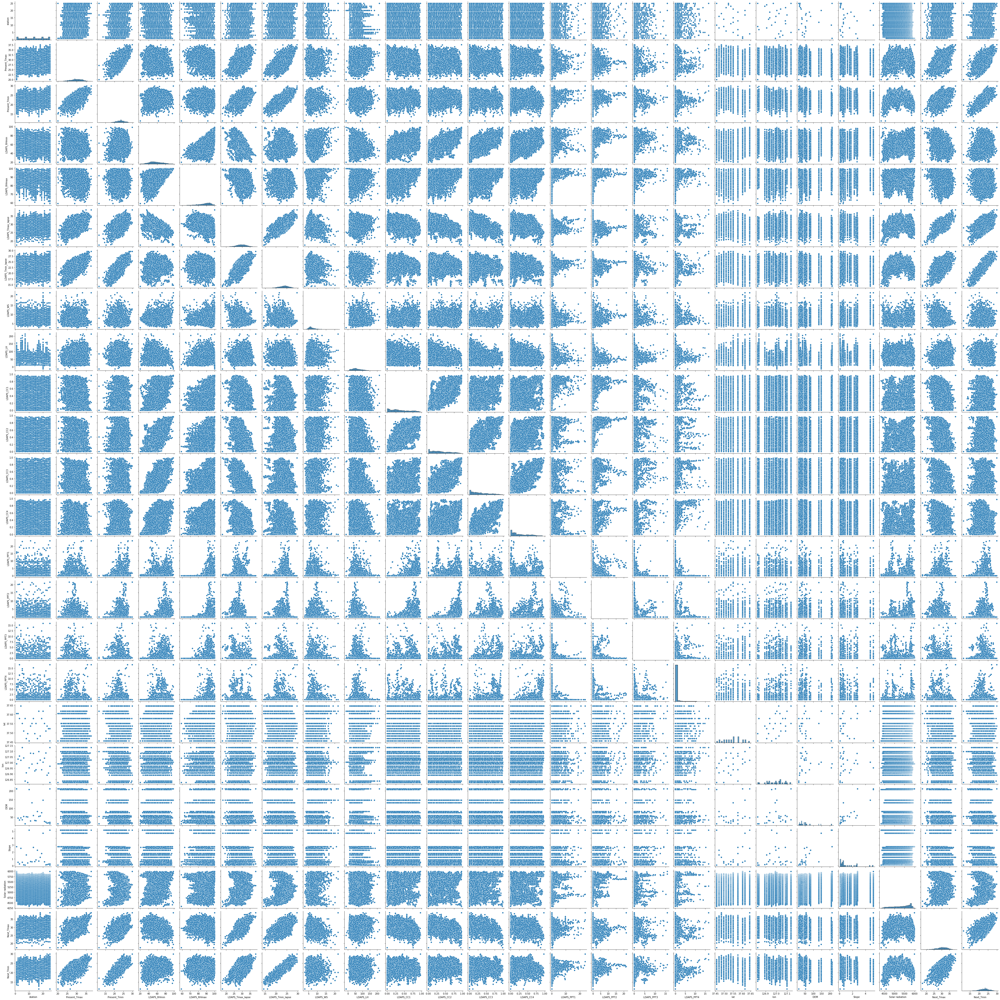

In [28]:
#Showing the columns interrelatedly with each other 

sns.pairplot(df)

array([[<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='D

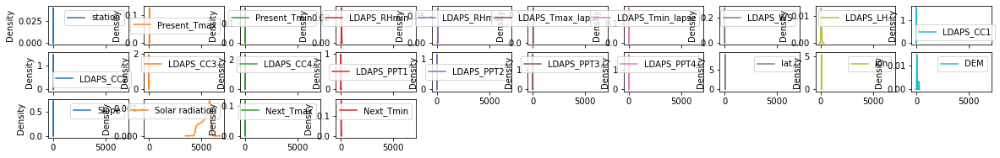

In [29]:
df.plot(kind='kde',subplots=True,layout=(10,10),figsize=(20,10))

# COREALTION

In [30]:
#Printing the corelation of all the columns with each other 

df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.111776,0.130522,-0.066498,-0.166788,0.068388,0.103435,0.006307,-0.132249,0.007072,...,-0.005717,-0.009616,-0.007513,-0.237367,-0.118721,-0.255339,-0.089596,-0.019175,0.106658,0.127650
Present_Tmax,0.111776,1.000000,0.618556,-0.204582,-0.308430,0.574712,0.631731,-0.125331,0.128107,-0.307408,...,-0.102192,-0.122079,-0.099068,-0.053037,0.005522,-0.187254,-0.107231,-0.025125,0.613377,0.624810
Present_Tmin,0.130522,0.618556,1.000000,0.121375,-0.021003,0.475268,0.775718,-0.033949,-0.017817,0.095303,...,0.065458,-0.048568,-0.063415,-0.078343,-0.047783,-0.249497,-0.146940,0.053955,0.473438,0.799022
LDAPS_RHmin,-0.066498,-0.204582,0.121375,1.000000,0.576600,-0.565265,0.085025,0.290631,-0.067878,0.606244,...,0.390904,0.241036,0.168918,0.086916,-0.076077,0.101901,0.123485,0.247154,-0.443221,0.093880
LDAPS_RHmax,-0.166788,-0.308430,-0.021003,0.576600,1.000000,-0.374495,-0.121587,0.137244,0.244137,0.429820,...,0.229412,0.135075,0.118466,0.195016,0.025564,0.176462,0.218723,0.154055,-0.290630,-0.078832
LDAPS_Tmax_lapse,0.068388,0.574712,0.475268,-0.565265,-0.374495,1.000000,0.657472,-0.307419,0.038767,-0.423312,...,-0.243352,-0.189151,-0.161565,-0.041809,0.090053,-0.177689,-0.161238,0.040841,0.837673,0.593139
LDAPS_Tmin_lapse,0.103435,0.631731,0.775718,0.085025,-0.121587,0.657472,1.000000,-0.129924,-0.144932,0.022003,...,-0.002706,-0.090263,-0.096669,-0.095343,-0.026447,-0.193602,-0.184087,0.151091,0.598891,0.886497
LDAPS_WS,0.006307,-0.125331,-0.033949,0.290631,0.137244,-0.307419,-0.129924,1.000000,0.008026,0.289114,...,0.191444,0.161147,0.143778,0.036601,-0.059375,0.190759,0.171364,0.121224,-0.342904,-0.098490
LDAPS_LH,-0.132249,0.128107,-0.017817,-0.067878,0.244137,0.038767,-0.144932,0.008026,1.000000,-0.152428,...,-0.075038,0.017650,0.021643,0.132641,0.025709,0.054895,0.086405,-0.041063,0.146836,-0.063710
LDAPS_CC1,0.007072,-0.307408,0.095303,0.606244,0.429820,-0.423312,0.022003,0.289114,-0.152428,1.000000,...,0.385295,0.166210,0.089359,-0.008097,-0.006814,-0.014033,-0.020667,0.213084,-0.440748,-0.003693


<AxesSubplot:>

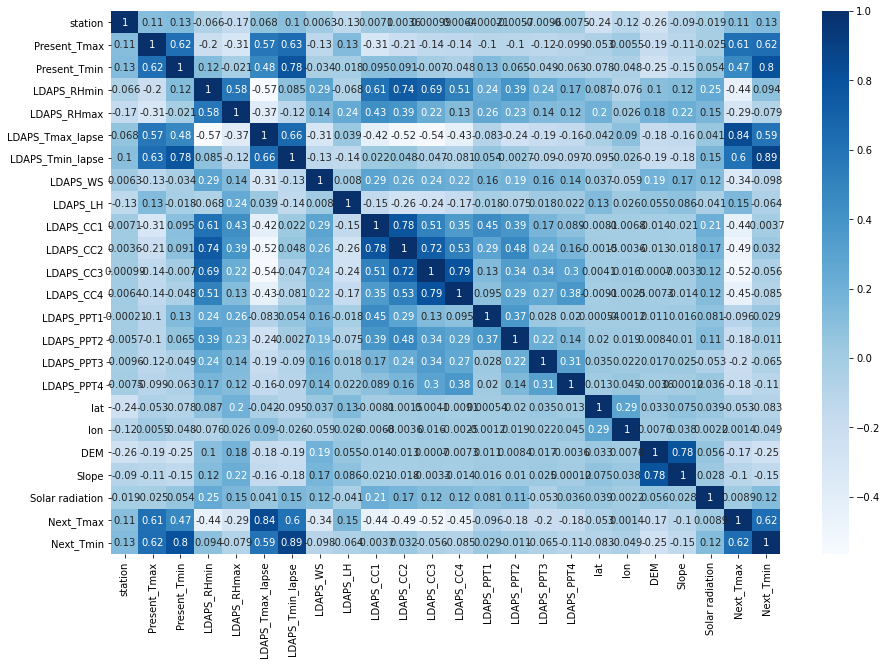

In [31]:
#Plotting the heatmap of the corelation of the columns
#All the darker shades are highly corelated here 

plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True,cmap='Blues',)

# SEPRATING COLUMNS

In [32]:
df['year'] = pd.DatetimeIndex(df['Date']).year
df['month'] = pd.DatetimeIndex(df['Date']).month
df['Day'] = pd.DatetimeIndex(df['Date']).day
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,Day
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,2013,6,30
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,2013,6,30
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,2013,6,30
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,2013,6,30
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,2013,6,30


# DROPING THE COLUMNS

In [33]:
#Dropping the Date column

df.drop("Date", axis=1,inplace=True)

In [34]:
#Printing the dataframe

df

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,Day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2,2013,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5,2013,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9,2013,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3,2013,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5,2013,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1,2017,8,30
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8,2017,8,30
7749,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,...,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4,2017,8,30
7750,25.0,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3,2017,8,30


# REMOVING OUTLIERS

In [35]:
#Importing zscore for removing outliers

from scipy.stats import zscore
z_score=abs(zscore(df))
print(df.shape)

(7752, 27)


In [36]:
#Storing the filtered data in df_out & printing its shape

df_out=df.loc[(z_score<3).all(axis=1)]
print(df_out.shape)

(6877, 27)


# SKEWNESS

In [37]:
#Printing skewness

df_out.skew()

station             0.002549
Present_Tmax       -0.274655
Present_Tmin       -0.220286
LDAPS_RHmin         0.306557
LDAPS_RHmax        -0.673899
LDAPS_Tmax_lapse   -0.123150
LDAPS_Tmin_lapse   -0.377871
LDAPS_WS            1.094623
LDAPS_LH            0.573553
LDAPS_CC1           0.576111
LDAPS_CC2           0.496944
LDAPS_CC3           0.698337
LDAPS_CC4           0.706098
LDAPS_PPT1          3.637983
LDAPS_PPT2          4.858258
LDAPS_PPT3          5.484668
LDAPS_PPT4          5.955834
lat                 0.108345
lon                -0.274949
DEM                 1.764176
Slope               1.593425
Solar radiation    -0.508573
Next_Tmax          -0.267642
Next_Tmin          -0.234850
year                0.006008
month              -0.683983
Day                 0.248114
dtype: float64

In [38]:
#Removing skewness

for col in df_out.columns:
    if df_out.skew().loc[col]>0.55:
        df_out[col]=np.log1p(df_out[col])

In [39]:
#Maximum skewness is removed 

df_out.skew()

station             0.002549
Present_Tmax       -0.274655
Present_Tmin       -0.220286
LDAPS_RHmin         0.306557
LDAPS_RHmax        -0.673899
LDAPS_Tmax_lapse   -0.123150
LDAPS_Tmin_lapse   -0.377871
LDAPS_WS            0.481734
LDAPS_LH           -0.612651
LDAPS_CC1           0.312354
LDAPS_CC2           0.496944
LDAPS_CC3           0.435115
LDAPS_CC4           0.492955
LDAPS_PPT1          2.685589
LDAPS_PPT2          3.637290
LDAPS_PPT3          4.207404
LDAPS_PPT4          4.633886
lat                 0.108345
lon                -0.274949
DEM                 0.450650
Slope               0.847623
Solar radiation    -0.508573
Next_Tmax          -0.267642
Next_Tmin          -0.234850
year                0.006008
month              -0.683983
Day                 0.248114
dtype: float64

In [40]:
#Making a dataframe of the filtered data

df_max=pd.DataFrame(data=df_out)
df_max

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,Day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.210218,...,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,2013,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.203356,...,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,2013,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.190078,...,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,2013,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.195873,...,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,2013,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.140985,...,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,2013,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,2.028576,2.362181,0.051550,...,37.5507,127.040,3.306813,0.452412,4456.024414,27.6,17.7,2017,8,30
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,1.912218,4.420607,0.064346,...,37.5102,127.086,3.134050,0.125045,4441.803711,28.0,17.1,2017,8,30
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,1.966961,4.291258,0.029592,...,37.5372,126.891,2.808655,0.144447,4443.313965,28.3,18.1,2017,8,30
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,2.020596,3.876219,0.035245,...,37.5237,126.909,2.906661,0.200734,4438.373535,28.6,18.8,2017,8,30


In [41]:
#Creating one more instance of the filtered data because we have 2 target variables 

df_min=pd.DataFrame(data=df_out)
df_min

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,Day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.210218,...,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,2013,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.203356,...,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,2013,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.190078,...,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,2013,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.195873,...,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,2013,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.140985,...,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,2013,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,2.028576,2.362181,0.051550,...,37.5507,127.040,3.306813,0.452412,4456.024414,27.6,17.7,2017,8,30
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,1.912218,4.420607,0.064346,...,37.5102,127.086,3.134050,0.125045,4441.803711,28.0,17.1,2017,8,30
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,1.966961,4.291258,0.029592,...,37.5372,126.891,2.808655,0.144447,4443.313965,28.3,18.1,2017,8,30
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,2.020596,3.876219,0.035245,...,37.5237,126.909,2.906661,0.200734,4438.373535,28.6,18.8,2017,8,30


# 1. FOR PREDICTING NEXT_TMAX

# DROPPING THE COLUMNS

In [42]:
#Dropping the columns that we don't need in the analysis part

df_max.drop("LDAPS_RHmin", axis=1,inplace=True)
df_max.drop("LDAPS_CC1", axis=1,inplace=True)
df_max.drop("LDAPS_CC2", axis=1,inplace=True)
df_max.drop("LDAPS_CC3", axis=1,inplace=True)
df_max.drop("LDAPS_CC4", axis=1,inplace=True)
df_max.drop("LDAPS_WS", axis=1,inplace=True)
df_max.drop("Day", axis=1,inplace=True)

In [43]:
#Printing the dataframe 

df_max

,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month
0,1.0,28.7,21.4,91.116364,28.074101,23.006936,4.254929,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,2013,6
1,2.0,31.9,21.6,90.604721,29.850689,24.035009,3.969111,0.0,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,2013,6
2,3.0,31.6,23.3,83.973587,30.091292,24.565633,3.071445,0.0,0.0,0.0,0.0,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,2013,6
3,4.0,32.0,23.4,96.483688,29.704629,23.326177,4.200612,0.0,0.0,0.0,0.0,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,2013,6
4,5.0,31.4,21.9,90.155128,29.113934,23.486480,4.691032,0.0,0.0,0.0,0.0,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,2013,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,78.261383,27.812697,18.303014,2.362181,0.0,0.0,0.0,0.0,37.5507,127.040,3.306813,0.452412,4456.024414,27.6,17.7,2017,8
7746,22.0,22.5,17.4,83.690018,26.704905,17.814038,4.420607,0.0,0.0,0.0,0.0,37.5102,127.086,3.134050,0.125045,4441.803711,28.0,17.1,2017,8
7747,23.0,23.3,17.1,78.869858,26.352081,18.775678,4.291258,0.0,0.0,0.0,0.0,37.5372,126.891,2.808655,0.144447,4443.313965,28.3,18.1,2017,8
7748,24.0,23.3,17.7,77.294975,27.010193,18.733519,3.876219,0.0,0.0,0.0,0.0,37.5237,126.909,2.906661,0.200734,4438.373535,28.6,18.8,2017,8


In [44]:
mid = df_max['Next_Tmax']
df_max.drop(labels=['Next_Tmax'], axis=1, inplace = True)
df_max.insert(0, 'Next_Tmax', mid)
df_max

,Next_Tmax,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,year,month
0,29.1,1.0,28.7,21.4,91.116364,28.074101,23.006936,4.254929,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,21.2,2013,6
1,30.5,2.0,31.9,21.6,90.604721,29.850689,24.035009,3.969111,0.0,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,22.5,2013,6
2,31.1,3.0,31.6,23.3,83.973587,30.091292,24.565633,3.071445,0.0,0.0,0.0,0.0,37.5776,127.058,3.535344,0.235941,5863.555664,23.9,2013,6
3,31.7,4.0,32.0,23.4,96.483688,29.704629,23.326177,4.200612,0.0,0.0,0.0,0.0,37.6450,127.022,3.844087,1.262657,5856.964844,24.3,2013,6
4,31.2,5.0,31.4,21.9,90.155128,29.113934,23.486480,4.691032,0.0,0.0,0.0,0.0,37.5507,127.135,3.584574,0.409125,5859.552246,22.5,2013,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,27.6,21.0,23.1,17.8,78.261383,27.812697,18.303014,2.362181,0.0,0.0,0.0,0.0,37.5507,127.040,3.306813,0.452412,4456.024414,17.7,2017,8
7746,28.0,22.0,22.5,17.4,83.690018,26.704905,17.814038,4.420607,0.0,0.0,0.0,0.0,37.5102,127.086,3.134050,0.125045,4441.803711,17.1,2017,8
7747,28.3,23.0,23.3,17.1,78.869858,26.352081,18.775678,4.291258,0.0,0.0,0.0,0.0,37.5372,126.891,2.808655,0.144447,4443.313965,18.1,2017,8
7748,28.6,24.0,23.3,17.7,77.294975,27.010193,18.733519,3.876219,0.0,0.0,0.0,0.0,37.5237,126.909,2.906661,0.200734,4438.373535,18.8,2017,8


In [45]:
#Checking wheather there are any null values present

df_max.isnull().sum()

Next_Tmax           0
station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_LH            1
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmin           0
year                0
month               0
dtype: int64

In [46]:
#Replacing null values with mode of the column

df_max["LDAPS_LH"] = df_max["LDAPS_LH"].fillna(df_max["LDAPS_LH"].dropna().mode().values[0] )

# DIVIDING X & Y

In [47]:
#Dividing the feature columns & storing it into x

x=df_max.iloc[:,1:20]
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,year,month
0,1.0,28.7,21.4,91.116364,28.074101,23.006936,4.254929,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,21.2,2013,6
1,2.0,31.9,21.6,90.604721,29.850689,24.035009,3.969111,0.0,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,22.5,2013,6
2,3.0,31.6,23.3,83.973587,30.091292,24.565633,3.071445,0.0,0.0,0.0,0.0,37.5776,127.058,3.535344,0.235941,5863.555664,23.9,2013,6
3,4.0,32.0,23.4,96.483688,29.704629,23.326177,4.200612,0.0,0.0,0.0,0.0,37.6450,127.022,3.844087,1.262657,5856.964844,24.3,2013,6
4,5.0,31.4,21.9,90.155128,29.113934,23.486480,4.691032,0.0,0.0,0.0,0.0,37.5507,127.135,3.584574,0.409125,5859.552246,22.5,2013,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,78.261383,27.812697,18.303014,2.362181,0.0,0.0,0.0,0.0,37.5507,127.040,3.306813,0.452412,4456.024414,17.7,2017,8
7746,22.0,22.5,17.4,83.690018,26.704905,17.814038,4.420607,0.0,0.0,0.0,0.0,37.5102,127.086,3.134050,0.125045,4441.803711,17.1,2017,8
7747,23.0,23.3,17.1,78.869858,26.352081,18.775678,4.291258,0.0,0.0,0.0,0.0,37.5372,126.891,2.808655,0.144447,4443.313965,18.1,2017,8
7748,24.0,23.3,17.7,77.294975,27.010193,18.733519,3.876219,0.0,0.0,0.0,0.0,37.5237,126.909,2.906661,0.200734,4438.373535,18.8,2017,8


In [48]:
#Assigning target variable & printing it

y=df_max.iloc[:,0:1]
y

,Next_Tmax
0,29.1
1,30.5
2,31.1
3,31.7
4,31.2
...,...
7745,27.6
7746,28.0
7747,28.3
7748,28.6


# SCALING 

In [49]:
#Importing Standard Scaler for Scaling the data

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler(copy=True, with_mean=True, with_std=True).fit(x)
df1_scaler = scaler.transform(x)
x = pd.DataFrame(df1_scaler)
x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,-1.672572,-0.433839,-0.824257,0.440881,-0.665826,-0.300478,0.458927,-0.407164,-0.339541,-0.306702,-0.275367,1.215079,0.002687,2.090916,1.332960,1.548014,-0.797517,-1.430481,-0.482998
1,-1.533653,0.680685,-0.737870,0.367419,-0.019635,0.158516,-0.004204,-0.407164,-0.339541,-0.306702,-0.275367,1.215079,0.517350,-0.026446,-0.501243,1.254355,-0.247070,-1.430481,-0.482998
2,-1.394733,0.576198,-0.003580,-0.584690,0.067878,0.395419,-1.458757,-0.407164,-0.339541,-0.306702,-0.275367,0.674616,0.843722,-0.422738,-0.859345,1.240675,0.345719,-1.430481,-0.482998
3,-1.255813,0.715513,0.039613,1.211530,-0.072761,-0.157949,0.370913,-0.407164,-0.339541,-0.306702,-0.275367,2.023772,0.391823,0.001922,1.196050,1.225014,0.515087,-1.430481,-0.482998
4,-1.116893,0.506540,-0.608289,0.302866,-0.287612,-0.086381,1.165576,-0.407164,-0.339541,-0.306702,-0.275367,0.136154,1.810286,-0.355024,-0.512646,1.231162,-0.247070,-1.430481,-0.482998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6872,1.105823,-2.384255,-2.379223,-1.404857,-0.760906,-2.400592,-2.608029,-0.407164,-0.339541,-0.306702,-0.275367,0.136154,0.617773,-0.737069,-0.425989,-2.103903,-2.279490,1.430689,0.409899
6873,1.244743,-2.593228,-2.551997,-0.625405,-1.163838,-2.618900,0.727386,-0.407164,-0.339541,-0.306702,-0.275367,-0.674541,1.195200,-0.974696,-1.081349,-2.137694,-2.533543,1.430689,0.409899
6874,1.383663,-2.314597,-2.681578,-1.317491,-1.292169,-2.189566,0.517793,-0.407164,-0.339541,-0.306702,-0.275367,-0.134077,-1.252590,-1.422258,-1.042510,-2.134106,-2.110122,1.430689,0.409899
6875,1.522583,-2.314597,-2.422417,-1.543615,-1.052797,-2.208389,-0.154724,-0.407164,-0.339541,-0.306702,-0.275367,-0.404309,-1.026640,-1.287457,-0.929827,-2.145845,-1.813727,1.430689,0.409899


# MODELS

In [50]:
#Creating a function for determining r2 score of different models

def maxr2_score(regr,x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.20,random_state=r_state)
        regr.fit(x_train,y_train)
        y_pred=regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("r2_score corresponding to random state: ",r_state,"is: ",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print()
    print()
    print("max r2_score correspondint to: ",final_r_state,"is ",max_r_score)
    return final_r_state

# LR

In [53]:
#Importing LinearRegression

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
lreg=LinearRegression()
r_state=maxr2_score(lreg,x,y)

r2_score corresponding to random state:  42 is:  0.7422800754420213
r2_score corresponding to random state:  43 is:  0.7610071029616083
r2_score corresponding to random state:  44 is:  0.7459804947143879
r2_score corresponding to random state:  45 is:  0.738711245656887
r2_score corresponding to random state:  46 is:  0.7640734965434185
r2_score corresponding to random state:  47 is:  0.7547721702988064
r2_score corresponding to random state:  48 is:  0.7590146072368896
r2_score corresponding to random state:  49 is:  0.7406352048402548
r2_score corresponding to random state:  50 is:  0.7283838235539715
r2_score corresponding to random state:  51 is:  0.7260532509212687
r2_score corresponding to random state:  52 is:  0.7596100898821037
r2_score corresponding to random state:  53 is:  0.7529789618500976
r2_score corresponding to random state:  54 is:  0.7735923116197154
r2_score corresponding to random state:  55 is:  0.7544828456082231
r2_score corresponding to random state:  56 is:  

# KNN

In [55]:
#Importing KNeighbors 

from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
neighbors={"n_neighbors":range(1,30)}
knn= KNeighborsRegressor()
gknn=GridSearchCV(knn,neighbors,cv=10)
gknn.fit(x,y)
gknn.best_params_

{'n_neighbors': 29}

In [56]:
#Applying best params

knn= KNeighborsRegressor(n_neighbors=29)
r_state=maxr2_score(knn,x,y)

r2_score corresponding to random state:  42 is:  0.7134430110217516
r2_score corresponding to random state:  43 is:  0.7335900636655401
r2_score corresponding to random state:  44 is:  0.7207439688141692
r2_score corresponding to random state:  45 is:  0.7096681443713999
r2_score corresponding to random state:  46 is:  0.7387586813088249
r2_score corresponding to random state:  47 is:  0.7069571074365565
r2_score corresponding to random state:  48 is:  0.7279497439980716
r2_score corresponding to random state:  49 is:  0.7164433799479002
r2_score corresponding to random state:  50 is:  0.7053309644488175
r2_score corresponding to random state:  51 is:  0.7095516829407582
r2_score corresponding to random state:  52 is:  0.7350727942332844
r2_score corresponding to random state:  53 is:  0.720143818768022
r2_score corresponding to random state:  54 is:  0.7346820293564038
r2_score corresponding to random state:  55 is:  0.7244057173241831
r2_score corresponding to random state:  56 is:  

# LASSO

In [57]:
#Importing Lasso

from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
isreh=Lasso()
parameters={"alpha":[0.001,0.01,0.1,1]}
grid=GridSearchCV(isreh,parameters,cv=10)
grid.fit(x,y)
grid.best_params_

{'alpha': 0.01}

In [58]:
#Calculating Max score

max_r_score=0
for r_state in range(42,100):
    x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=.20,random_state=r_state)
    lasso=Lasso(alpha=0.01)
    lasso.fit(x_train,y_train)
    y_pred=lasso.predict(x_test)
    r2_scr=r2_score(y_test,y_pred)
    print("r2_score corresponding to random state: ",r_state,"is: ",r2_scr)
    if r2_scr>max_r_score:
        max_r_score=r2_scr
        final_r_state=r_state
print()
print()
print("max r2_score correspondint to: ",final_r_state,"is ",max_r_score)

r2_score corresponding to random state:  42 is:  0.7416773112465158
r2_score corresponding to random state:  43 is:  0.7611127287100413
r2_score corresponding to random state:  44 is:  0.744646088391935
r2_score corresponding to random state:  45 is:  0.738661454828667
r2_score corresponding to random state:  46 is:  0.7645866649431108
r2_score corresponding to random state:  47 is:  0.7537706322587407
r2_score corresponding to random state:  48 is:  0.7579263716964681
r2_score corresponding to random state:  49 is:  0.7404871662687388
r2_score corresponding to random state:  50 is:  0.7276268510914194
r2_score corresponding to random state:  51 is:  0.7264665715983144
r2_score corresponding to random state:  52 is:  0.7591134402233706
r2_score corresponding to random state:  53 is:  0.7520803576113032
r2_score corresponding to random state:  54 is:  0.7734936163967578
r2_score corresponding to random state:  55 is:  0.7534488569887103
r2_score corresponding to random state:  56 is:  0

In [59]:
#Importing Regressors 

from math import log
from math import sqrt
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
estimator = RandomForestRegressor()
param_grid = { 
            "n_estimators"      : [10,50,100,200,500],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8],
            "bootstrap": [True, False],
            }

grid = GridSearchCV(estimator, param_grid, n_jobs=-1, cv=5)

grid.fit(x_train, y_train)

grid.best_params_

{'bootstrap': False,
 'max_features': 'sqrt',
 'min_samples_split': 2,
 'n_estimators': 500}

In [60]:
#Passing best params

rr=RandomForestRegressor(bootstrap=False,max_features='sqrt',min_samples_split=2,n_estimators=500)
rr.fit(x_train, y_train)
rr.score(x_train,y_train)

0.9999999969827309

In [61]:
#Predicting 

pred=rr.predict(x_test)
pred

array([27.843 , 29.6882, 31.129 , ..., 30.8346, 32.4594, 32.1386])

In [64]:
#Printing results

from sklearn.metrics import mean_squared_error
print("Test Results for Random Forest Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test,pred)))
print("R-squared: ", r2_score(y_test,pred))

Test Results for Random Forest Regressor Model:
--------------------------------------------------
Root mean squared error:  0.9382072487340094
R-squared:  0.8977076841571261


# GRADIENT

In [65]:
#Importing Gradient

from sklearn.ensemble import GradientBoostingRegressor
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.20)
model = GradientBoostingRegressor()
parameters = {'learning_rate': [0.001,0.01,0.1,0.02,0.03,1],
              'subsample'    : [0.9, 0.5, 0.2],
              'n_estimators' : [100,500,1000],
              'max_depth'    : [4,6,8]}
grid = GridSearchCV(estimator=model, param_grid = parameters, cv = 2, n_jobs=-1)
grid.fit(x_train, y_train)
grid.best_params_

{'learning_rate': 0.03, 'max_depth': 6, 'n_estimators': 1000, 'subsample': 0.5}

In [66]:
#Passing best params

gbr= GradientBoostingRegressor(learning_rate=0.03,max_depth=6,n_estimators=1000,subsample=0.5)
gbr.fit(x_train, y_train)
gbr.score(x_train,y_train)

0.9905441133997795

In [67]:
#Predicting model

pred_gbr=gbr.predict(x_test)
pred_gbr

array([24.61982808, 32.83414265, 29.55964023, ..., 33.90158458,
       28.14345849, 32.82764305])

In [68]:
#Printing the scores

print("Test Results for GradientBoostingRegressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test,pred_gbr)))
print("R-squared: ", r2_score(y_test,pred_gbr))

Test Results for GradientBoostingRegressor Model:
--------------------------------------------------
Root mean squared error:  0.890151352164209
R-squared:  0.9072679282999075


# CROSS VALIDATION

In [70]:
#Printing the mean & standard r2 score for each model

from sklearn.model_selection import cross_val_score
print("Mean r2 score for Linear Regression: ",cross_val_score(lreg,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for Linear Regression: ",cross_val_score(lreg,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for knn: ",cross_val_score(knn,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for knn: ",cross_val_score(knn,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for R_forest Regressor ",cross_val_score(rr,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for R_forst Regressor ",cross_val_score(rr,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for lasso ",cross_val_score(lasso,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for lasso ",cross_val_score(lasso,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for GBR ",cross_val_score(gbr,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for GBR ",cross_val_score(gbr,x,y,cv=5,scoring="r2").std())

Mean r2 score for Linear Regression:  0.66749869490756
Standard Deviation r2 score for Linear Regression:  0.06596037663626096


Mean r2 score for knn:  0.49713333344439825
Standard Deviation r2 score for knn:  0.06826848140755272


Mean r2 score for R_forest Regressor  0.6630640784614041
Standard Deviation r2 score for R_forst Regressor  0.08158433504830466


Mean r2 score for lasso  0.6687402010834544
Standard Deviation r2 score for lasso  0.06751551119085179


Mean r2 score for GBR  0.6721551752889319
Standard Deviation r2 score for GBR  0.06140420819245574


# CHOSSING & SAVING THE MODEL FOR NEXT_TMAX

GBR IS THE BEST MODEL 

In [71]:
#Importing joblib for saving the model

import joblib

In [72]:
#Dumping the model to the file

joblib.dump(gbr,'TEMP-MAX.obj')

['TEMP-MAX.obj']

In [73]:
#Loading it back 

model=joblib.load('TEMP-MAX.obj')

In [74]:
#Making predictions

gbr.predict(x_test)

array([24.61982808, 32.83414265, 29.55964023, ..., 33.90158458,
       28.14345849, 32.82764305])

# 2. FOR PREDICTING NEXT_TMIN

In [75]:
#Here our second instance will help us that we had created earlier

df_min

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,Day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.210218,...,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,2013,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.203356,...,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,2013,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.190078,...,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,2013,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.195873,...,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,2013,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.140985,...,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,2013,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,2.028576,2.362181,0.051550,...,37.5507,127.040,3.306813,0.452412,4456.024414,27.6,17.7,2017,8,30
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,1.912218,4.420607,0.064346,...,37.5102,127.086,3.134050,0.125045,4441.803711,28.0,17.1,2017,8,30
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,1.966961,4.291258,0.029592,...,37.5372,126.891,2.808655,0.144447,4443.313965,28.3,18.1,2017,8,30
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,2.020596,3.876219,0.035245,...,37.5237,126.909,2.906661,0.200734,4438.373535,28.6,18.8,2017,8,30


In [76]:
#Again dropping the columns that we dont need 

df_min.drop("LDAPS_PPT4", axis=1,inplace=True)
df_min.drop("DEM", axis=1,inplace=True)
df_min.drop("Slope", axis=1,inplace=True)
df_min.drop("Day", axis=1,inplace=True)
df_min.drop("LDAPS_RHmax", axis=1,inplace=True)
df_min

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,lat,lon,Solar radiation,Next_Tmax,Next_Tmin,year,month
0,1.0,28.7,21.4,58.255688,28.074101,23.006936,2.056542,4.254929,0.210218,0.203896,...,0.0,0.0,0.0,37.6046,126.991,5992.895996,29.1,21.2,2013,6
1,2.0,31.9,21.6,52.263397,29.850689,24.035009,1.900896,3.969111,0.203356,0.251771,...,0.0,0.0,0.0,37.6046,127.032,5869.312500,30.5,22.5,2013,6
2,3.0,31.6,23.3,48.690479,30.091292,24.565633,1.965464,3.071445,0.190078,0.257469,...,0.0,0.0,0.0,37.5776,127.058,5863.555664,31.1,23.9,2013,6
3,4.0,32.0,23.4,58.239788,29.704629,23.326177,1.894624,4.200612,0.195873,0.226002,...,0.0,0.0,0.0,37.6450,127.022,5856.964844,31.7,24.3,2013,6
4,5.0,31.4,21.9,56.174095,29.113934,23.486480,1.907318,4.691032,0.140985,0.249995,...,0.0,0.0,0.0,37.5507,127.135,5859.552246,31.2,22.5,2013,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,27.812697,18.303014,2.028576,2.362181,0.051550,0.030169,...,0.0,0.0,0.0,37.5507,127.040,4456.024414,27.6,17.7,2017,8
7746,22.0,22.5,17.4,30.094858,26.704905,17.814038,1.912218,4.420607,0.064346,0.024518,...,0.0,0.0,0.0,37.5102,127.086,4441.803711,28.0,17.1,2017,8
7747,23.0,23.3,17.1,26.741310,26.352081,18.775678,1.966961,4.291258,0.029592,0.081035,...,0.0,0.0,0.0,37.5372,126.891,4443.313965,28.3,18.1,2017,8
7748,24.0,23.3,17.7,24.040634,27.010193,18.733519,2.020596,3.876219,0.035245,0.074962,...,0.0,0.0,0.0,37.5237,126.909,4438.373535,28.6,18.8,2017,8


In [78]:
mid = df_min['Next_Tmin']
df_min.drop(labels=['Next_Tmin'], axis=1, inplace = True)
df_min.insert(0, 'Next_Tmin', mid)

In [79]:
#Checking wheather any null values present or not

df_min.isnull().sum()

Next_Tmin           0
station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            1
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
lat                 0
lon                 0
Solar radiation     0
Next_Tmax           0
year                0
month               0
dtype: int64

In [80]:
#Handling missing values 

df_min["LDAPS_LH"] = df_min["LDAPS_LH"].fillna(df_min["LDAPS_LH"].dropna().mode().values[0] )

In [81]:
#After removing the Nan value cross checking it

df_min.isnull().sum()

Next_Tmin           0
station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
lat                 0
lon                 0
Solar radiation     0
Next_Tmax           0
year                0
month               0
dtype: int64

# DIVIDING X & Y

In [82]:
#Storing feature variables in x & printing it

x=df_min.iloc[:,1:22]
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,lat,lon,Solar radiation,Next_Tmax,year,month
0,1.0,28.7,21.4,58.255688,28.074101,23.006936,2.056542,4.254929,0.210218,0.203896,...,0.123039,0.0,0.0,0.0,37.6046,126.991,5992.895996,29.1,2013,6
1,2.0,31.9,21.6,52.263397,29.850689,24.035009,1.900896,3.969111,0.203356,0.251771,...,0.120204,0.0,0.0,0.0,37.6046,127.032,5869.312500,30.5,2013,6
2,3.0,31.6,23.3,48.690479,30.091292,24.565633,1.965464,3.071445,0.190078,0.257469,...,0.132891,0.0,0.0,0.0,37.5776,127.058,5863.555664,31.1,2013,6
3,4.0,32.0,23.4,58.239788,29.704629,23.326177,1.894624,4.200612,0.195873,0.226002,...,0.125970,0.0,0.0,0.0,37.6450,127.022,5856.964844,31.7,2013,6
4,5.0,31.4,21.9,56.174095,29.113934,23.486480,1.907318,4.691032,0.140985,0.249995,...,0.157022,0.0,0.0,0.0,37.5507,127.135,5859.552246,31.2,2013,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,27.812697,18.303014,2.028576,2.362181,0.051550,0.030169,...,0.004370,0.0,0.0,0.0,37.5507,127.040,4456.024414,27.6,2017,8
7746,22.0,22.5,17.4,30.094858,26.704905,17.814038,1.912218,4.420607,0.064346,0.024518,...,0.017523,0.0,0.0,0.0,37.5102,127.086,4441.803711,28.0,2017,8
7747,23.0,23.3,17.1,26.741310,26.352081,18.775678,1.966961,4.291258,0.029592,0.081035,...,0.000000,0.0,0.0,0.0,37.5372,126.891,4443.313965,28.3,2017,8
7748,24.0,23.3,17.7,24.040634,27.010193,18.733519,2.020596,3.876219,0.035245,0.074962,...,0.000000,0.0,0.0,0.0,37.5237,126.909,4438.373535,28.6,2017,8


In [83]:
#Storing target variable in y & printing it

y=df_min.iloc[:,0:1]
y

,Next_Tmin
0,21.2
1,22.5
2,23.9
3,24.3
4,22.5
...,...
7745,17.7
7746,17.1
7747,18.1
7748,18.8


# SCALING

In [84]:
#Imprting Standard Scaler for scaling the data

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler(copy=True, with_mean=True, with_std=True).fit(x)
df1_scaler = scaler.transform(x)
x = pd.DataFrame(df1_scaler)
x

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-1.672572,-0.433839,-0.824257,0.190921,-0.665826,-0.300478,0.090824,0.458927,-0.389335,-0.533334,...,-0.592361,-0.407164,-0.339541,-0.306702,1.215079,0.002687,1.548014,-0.493615,-1.430481,-0.482998
1,-1.533653,0.680685,-0.737870,-0.241203,-0.019635,0.158516,-0.615536,-0.004204,-0.427027,-0.334062,...,-0.608343,-0.407164,-0.339541,-0.306702,1.215079,0.517350,1.254355,-0.016837,-1.430481,-0.482998
2,-1.394733,0.576198,-0.003580,-0.498858,0.067878,0.395419,-0.322512,-1.458757,-0.499951,-0.310345,...,-0.536806,-0.407164,-0.339541,-0.306702,0.674616,0.843722,1.240675,0.187496,-1.430481,-0.482998
3,-1.255813,0.715513,0.039613,0.189774,-0.072761,-0.157949,-0.643999,0.370913,-0.468124,-0.441320,...,-0.575829,-0.407164,-0.339541,-0.306702,2.023772,0.391823,1.225014,0.391829,-1.430481,-0.482998
4,-1.116893,0.506540,-0.608289,0.040810,-0.287612,-0.086381,-0.586391,1.165576,-0.769581,-0.341455,...,-0.400734,-0.407164,-0.339541,-0.306702,0.136154,1.810286,1.231162,0.221552,-1.430481,-0.482998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6872,1.105823,-2.384255,-2.379223,-2.229685,-0.760906,-2.400592,-0.036092,-2.608029,-1.260771,-1.256435,...,-1.261521,-0.407164,-0.339541,-0.306702,0.136154,0.617773,-2.103903,-1.004448,1.430689,0.409899
6873,1.244743,-2.593228,-2.551997,-1.839851,-1.163838,-2.618900,-0.564156,0.727386,-1.190496,-1.279954,...,-1.187352,-0.407164,-0.339541,-0.306702,-0.674541,1.195200,-2.137694,-0.868226,1.430689,0.409899
6874,1.383663,-2.314597,-2.681578,-2.081686,-1.292169,-2.189566,-0.315718,0.517793,-1.381371,-1.044716,...,-1.286165,-0.407164,-0.339541,-0.306702,-0.134077,-1.252590,-2.134106,-0.766059,1.430689,0.409899
6875,1.522583,-2.314597,-2.422417,-2.276441,-1.052797,-2.208389,-0.072309,-0.154724,-1.350322,-1.069992,...,-1.286165,-0.407164,-0.339541,-0.306702,-0.404309,-1.026640,-2.145845,-0.663892,1.430689,0.409899


# SELECTING MODEL

In [85]:
#Defining a function for determining the best r2 score

def maxr2_score(regr,x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.20,random_state=r_state)
        regr.fit(x_train,y_train)
        y_pred=regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("r2_score corresponding to random state: ",r_state,"is: ",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print()
    print()
    print("max r2_score correspondint to: ",final_r_state,"is ",max_r_score)
    return final_r_state

# LR

In [86]:
#Creating an instance of LinearRegression & finding the score of it

lreg=LinearRegression()
r_state=maxr2_score(lreg,x,y)

r2_score corresponding to random state:  42 is:  0.8288875566221596
r2_score corresponding to random state:  43 is:  0.8280832256834065
r2_score corresponding to random state:  44 is:  0.8244345243522944
r2_score corresponding to random state:  45 is:  0.8192906813172592
r2_score corresponding to random state:  46 is:  0.8294683158447991
r2_score corresponding to random state:  47 is:  0.821000842630373
r2_score corresponding to random state:  48 is:  0.8275484363508118
r2_score corresponding to random state:  49 is:  0.8259850844051869
r2_score corresponding to random state:  50 is:  0.823768473405063
r2_score corresponding to random state:  51 is:  0.8242099144332351
r2_score corresponding to random state:  52 is:  0.8360881487973311
r2_score corresponding to random state:  53 is:  0.824382846792423
r2_score corresponding to random state:  54 is:  0.8300771284953179
r2_score corresponding to random state:  55 is:  0.8262237799144239
r2_score corresponding to random state:  56 is:  0.

# KNN

In [87]:
#Importing KNeighbors

from sklearn.neighbors import KNeighborsRegressor
neighbors={"n_neighbors":range(1,30)}
knn= KNeighborsRegressor()
gknn=GridSearchCV(knn,neighbors,cv=10)
gknn.fit(x,y)
gknn.best_params_

{'n_neighbors': 29}

In [88]:
#Passing best params

knn= KNeighborsRegressor(n_neighbors=29)
r_state=maxr2_score(knn,x,y)

r2_score corresponding to random state:  42 is:  0.8499855818531978
r2_score corresponding to random state:  43 is:  0.8491913014341281
r2_score corresponding to random state:  44 is:  0.8391137357206964
r2_score corresponding to random state:  45 is:  0.8409436811504105
r2_score corresponding to random state:  46 is:  0.8378742339258528
r2_score corresponding to random state:  47 is:  0.8421750267340115
r2_score corresponding to random state:  48 is:  0.8455941971001747
r2_score corresponding to random state:  49 is:  0.8392427368417263
r2_score corresponding to random state:  50 is:  0.8362903983634742
r2_score corresponding to random state:  51 is:  0.8448725965944879
r2_score corresponding to random state:  52 is:  0.8467543787437495
r2_score corresponding to random state:  53 is:  0.8356234914033247
r2_score corresponding to random state:  54 is:  0.8420803063846395
r2_score corresponding to random state:  55 is:  0.8510607165746567
r2_score corresponding to random state:  56 is: 

# LASSO

In [89]:
#Importing Lasso

from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
isreh=Lasso()
parameters={"alpha":[0.001,0.01,0.1,1]}
grid=GridSearchCV(isreh,parameters,cv=10)
grid.fit(x,y)
grid.best_params_

{'alpha': 0.1}

In [90]:
#Passing best params

max_r_score=0
for r_state in range(42,100):
    x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=.20,random_state=r_state)
    lasso=Lasso(alpha=0.1)
    lasso.fit(x_train,y_train)
    y_pred=lasso.predict(x_test)
    r2_scr=r2_score(y_test,y_pred)
    print("r2_score corresponding to random state: ",r_state,"is: ",r2_scr)
    if r2_scr>max_r_score:
        max_r_score=r2_scr
        final_r_state=r_state
print()
print()
print("max r2_score correspondint to: ",final_r_state,"is ",max_r_score)

r2_score corresponding to random state:  42 is:  0.8188698578714013
r2_score corresponding to random state:  43 is:  0.8191325858030641
r2_score corresponding to random state:  44 is:  0.8074690585384598
r2_score corresponding to random state:  45 is:  0.8106603741709028
r2_score corresponding to random state:  46 is:  0.8168082376561725
r2_score corresponding to random state:  47 is:  0.8146744992032275
r2_score corresponding to random state:  48 is:  0.8130183014201985
r2_score corresponding to random state:  49 is:  0.8141974787298378
r2_score corresponding to random state:  50 is:  0.8066473731022236
r2_score corresponding to random state:  51 is:  0.8148662119092782
r2_score corresponding to random state:  52 is:  0.8220788581895528
r2_score corresponding to random state:  53 is:  0.8108274777329624
r2_score corresponding to random state:  54 is:  0.8153388073077887
r2_score corresponding to random state:  55 is:  0.8161884716731815
r2_score corresponding to random state:  56 is: 

In [91]:
#Importing regressors

from math import log
from math import sqrt
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
estimator = RandomForestRegressor()
param_grid = { 
            "n_estimators"      : [10,50,100,200,500],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8],
            "bootstrap": [True, False],
            }

grid = GridSearchCV(estimator, param_grid, n_jobs=-1, cv=5)

grid.fit(x_train, y_train)

grid.best_params_

{'bootstrap': False,
 'max_features': 'sqrt',
 'min_samples_split': 2,
 'n_estimators': 500}

In [92]:
#Passing best params

rr_min=RandomForestRegressor(bootstrap=False,max_features='sqrt',min_samples_split=2,n_estimators=500)
rr_min.fit(x_train, y_train)
rr_min.score(x_train,y_train)

0.9999999998225674

In [93]:
#Predicting the model

pred_min=rr_min.predict(x_test)
pred_min

array([23.6922, 25.7392, 24.3576, ..., 24.3724, 22.4476, 23.896 ])

In [94]:
#Printing scores

print("Test Results for Random Forest Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test,pred_min)))
print("R-squared: ", r2_score(y_test,pred_min))

Test Results for Random Forest Regressor Model:
--------------------------------------------------
Root mean squared error:  0.6313729187485548
R-squared:  0.9286459828216967


# GRADIENT

In [95]:
#Importing Gradient & determining best params

from sklearn.ensemble import GradientBoostingRegressor
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.20)
model = GradientBoostingRegressor()
parameters = {'learning_rate': [0.001,0.01,0.1,0.02,0.03,1],
              'subsample'    : [0.9, 0.5, 0.2],
              'n_estimators' : [100,500,1000],
              'max_depth'    : [4,6,8]}
grid = GridSearchCV(estimator=model, param_grid = parameters, cv = 2, n_jobs=-1)
grid.fit(x_train, y_train)
grid.best_params_

{'learning_rate': 0.02, 'max_depth': 8, 'n_estimators': 1000, 'subsample': 0.2}

In [96]:
#Passing best params

gbr_min= GradientBoostingRegressor(learning_rate=0.02,max_depth=8,n_estimators=1000,subsample=0.2)
gbr_min.fit(x_train, y_train)
gbr_min.score(x_train,y_train)

0.9948988426851484

In [97]:
#Predicting the model

pred_gbr_min=gbr_min.predict(x_test)
pred_gbr_min

array([21.19389494, 25.89233293, 22.06391191, ..., 21.68197355,
       21.08199162, 22.28003614])

In [98]:
#Printing scores

print("Test Results for Random Forest Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test,pred_gbr_min)))
print("R-squared: ", r2_score(y_test,pred_gbr_min))

Test Results for Random Forest Regressor Model:
--------------------------------------------------
Root mean squared error:  0.5724648283078457
R-squared:  0.9442128206522579


# CROSS VALIDATION

In [99]:
#Cross validating all the models

print("Mean r2 score for Linear Regression: ",cross_val_score(lreg,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for Linear Regression: ",cross_val_score(lreg,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for knn: ",cross_val_score(knn,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for knn: ",cross_val_score(knn,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for R_forest Regressor ",cross_val_score(rr_min,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for R_forst Regressor ",cross_val_score(rr_min,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for lasso ",cross_val_score(lasso,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for lasso ",cross_val_score(lasso,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for GBR ",cross_val_score(gbr_min,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for GBR ",cross_val_score(gbr_min,x,y,cv=5,scoring="r2").std())

Mean r2 score for Linear Regression:  0.7766502459180911
Standard Deviation r2 score for Linear Regression:  0.07497661151218611


Mean r2 score for knn:  0.6840847056396333
Standard Deviation r2 score for knn:  0.08991428646083441


Mean r2 score for R_forest Regressor  0.7725338365027046
Standard Deviation r2 score for R_forst Regressor  0.07772102317176142


Mean r2 score for lasso  0.778739751056529
Standard Deviation r2 score for lasso  0.07155380601194658


Mean r2 score for GBR  0.7997482504824072
Standard Deviation r2 score for GBR  0.06934205234803735


# CHOSSING & SAVING THE MODEL FOR NEXT_TMIN

In [100]:
#Importing joblib for saving the model

import joblib

In [101]:
#Dumping the model

joblib.dump(gbr_min,'TEMP-MIN.obj')

['TEMP-MIN.obj']

In [102]:
#Loading the model

model=joblib.load('TEMP-MIN.obj')

In [103]:
#Predicting the model

gbr_min.predict(x_test)

array([21.19389494, 25.89233293, 22.06391191, ..., 21.68197355,
       21.08199162, 22.28003614])

In [104]:
#END